In [19]:
from PIL import Image
import numpy as np

# Load the image
image_path = r"rawimage\0010.jpg"
original_image = Image.open(image_path)

# Convert the image to grayscale
grayscale_image = original_image.convert("L")

# Get the pixel matrix
pixel_matrix = np.array(grayscale_image)

# Display the original and grayscale images
#original_image.show(title="Original Image")
#grayscale_image.show(title="Grayscale Image")

# Print the pixel matrix
print("Pixel Matrix:\n", pixel_matrix)
print(pixel_matrix.shape)

Pixel Matrix:
 [[214 204 191 ... 222 205 202]
 [188 210 216 ... 252 194 153]
 [221 192 156 ... 219 228 206]
 ...
 [231 211 246 ... 252 226 173]
 [218 237 188 ... 224 213 253]
 [231 219 203 ... 216 211 202]]
(512, 512)


To fit a distribution to the rows and columns of pixel matrix in the baseline defect detection, we have started with two different approaches. In this part, we will try both approaches and choose one of them.

First Approach: Fitting a distribution for rows and column seperately by getting row averages and column averages. After obtaining these two distributions, out of control pixels are determined both row-vise and column-vise.

Second Approach: The pixel matrix is flattened and bought to the one dimensional array. Afterwards a distribution is fitted to the whole matrix and out of control situations are determined according to one distribution.


Below, we will first analyze the first approach by fitting a distribution to the row averages and column averages.

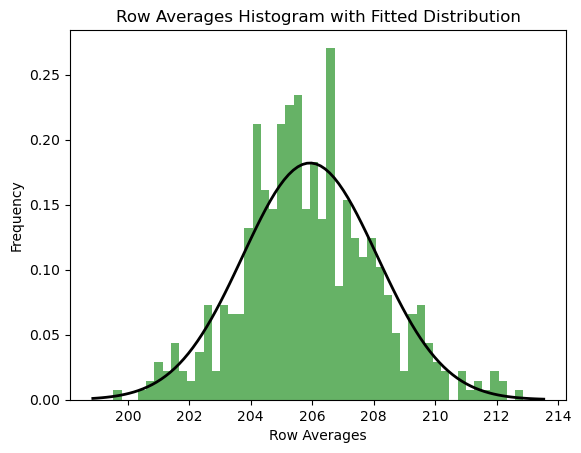

Mean: 205.93, Standard Deviation: 2.19


In [20]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm

# Calculate row averages
row_averages = np.mean(pixel_matrix, axis=1)

# Draw a histogram
plt.hist(row_averages, bins=50, density=True, alpha=0.6, color='g')

# Fit a normal distribution to the data
mu, sigma = norm.fit(row_averages)
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)
p = norm.pdf(x, mu, sigma)
plt.plot(x, p, 'k', linewidth=2)

# Add labels and title
plt.title("Row Averages Histogram with Fitted Distribution")
plt.xlabel("Row Averages")
plt.ylabel("Frequency")

# Display the plot
plt.show()

# Print mean and standard deviation of the fitted distribution
print(f"Mean: {mu:.2f}, Standard Deviation: {sigma:.2f}")

Component 1:
  Mean: 207.90427859058497
  Covariance: 1.0675970908526389
  Weight: 0.5000468925668271

Component 2:
  Mean: 203.94927810147018
  Covariance: 1.0239379433605251
  Weight: 0.4999531074331729



c:\Users\saime\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


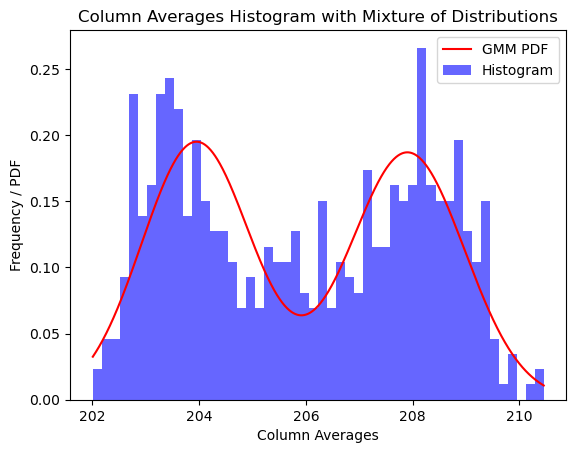

In [21]:
from scipy.stats import norm
from sklearn.mixture import GaussianMixture
import matplotlib.pyplot as plt
import numpy as np

# Calculate column averages
column_averages = np.mean(pixel_matrix, axis=0)

# Draw a histogram
plt.hist(column_averages, bins=50, density=True, alpha=0.6, color='b', label='Histogram')

# Fit a mixture of two normal distributions to the data
gmm = GaussianMixture(n_components=2)

column_averages = column_averages.reshape(-1, 1)  # Reshape for GMM
gmm.fit(column_averages)
means = gmm.means_.flatten()
covariances = np.sqrt(gmm.covariances_).flatten()

# Plot the PDF of the fitted Gaussian mixture
x = np.linspace(min(column_averages), max(column_averages), 1000)
pdf = np.sum([gmm.weights_[i] * norm.pdf(x, means[i], covariances[i]) for i in range(2)], axis=0)
plt.plot(x, pdf, 'r-', label='GMM PDF')

# Print the parameters of the fitted distribution
for i in range(2):
    print(f"Component {i+1}:")
    print(f"  Mean: {means[i]}")
    print(f"  Covariance: {covariances[i]}")
    print(f"  Weight: {gmm.weights_[i]}")
    print()

# Add labels and title
plt.title("Column Averages Histogram with Mixture of Distributions")
plt.xlabel("Column Averages")
plt.ylabel("Frequency / PDF")
plt.legend()

# Display the plot
plt.show()


Row averages are fitted to a normal distribution and column averages are fitted to a mixture of normal (Gaussian) distribution. However, in that case, since we have fitted the distributions according to the averages, we don't have enough data for the approximation. Also, since the out of control pixels are determined both row-vise and column-vise, there are more than necessary out of control points which causes Type-2 error, false alarms. Therefore the second approach is taken by flattening the pixel matrix.

In the next cell, we have worked with only one distribution to determine out of control situations by converting the pixel matrix to 1D array.

Mean: 205.93
Standard Deviation: 22.05


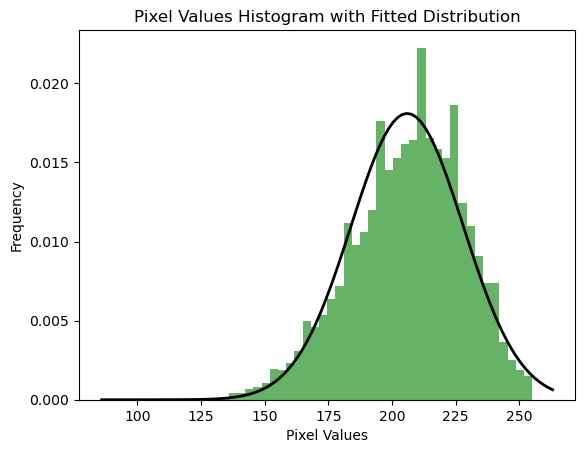

In [22]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm


# Flatten the pixel matrix to a 1D array
pixel_values = pixel_matrix.flatten()

# Draw a histogram
plt.hist(pixel_values, bins=50, density=True, alpha=0.6, color='g')

# Fit a normal distribution to the data
mu, sigma = norm.fit(pixel_values)

# Print the parameters of the fitted distribution
print(f"Mean: {mu:.2f}")
print(f"Standard Deviation: {sigma:.2f}")

# Plot the fitted normal distribution
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)
p = norm.pdf(x, mu, sigma)
plt.plot(x, p, 'k', linewidth=2)

# Add labels and title
plt.title("Pixel Values Histogram with Fitted Distribution")
plt.xlabel("Pixel Values")
plt.ylabel("Frequency")

# Display the plot
plt.show()


By utilizing Mean: 205.93, Standard Deviation: 22.05 values, we will determine 0.001 probability limits by using inverse of normal distribution.

[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]


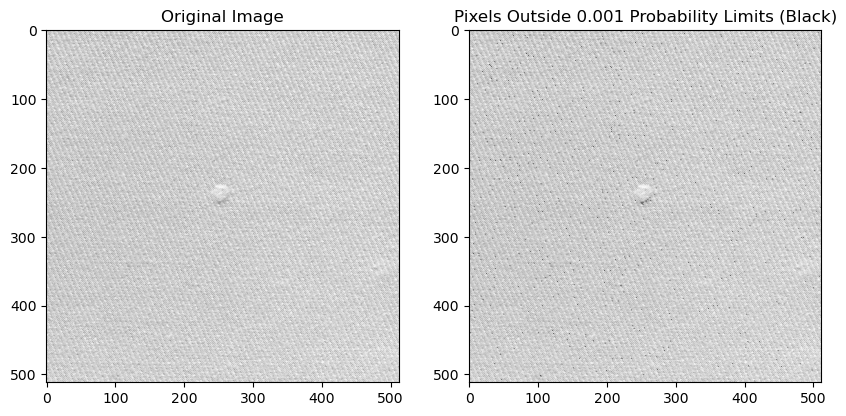

In [23]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm

# Flatten the pixel matrix to a 1D array
pixel_values = pixel_matrix.flatten()

# Fit a normal distribution to the data
mu, sigma = norm.fit(pixel_values)

# Calculate the lower and upper bounds for the 0.001 probability limits

lower_bound = norm.ppf(0.001, loc=mu, scale=sigma)
upper_bound = norm.ppf(0.999, loc=mu, scale=sigma)
#lower_bound = 130
#upper_bound = 210


# Create a mask for pixels outside the bounds
outliers_mask = (pixel_matrix < lower_bound) | (pixel_matrix > upper_bound)
print(outliers_mask)
# Create a modified image with outliers set to black
modified_image = np.copy(pixel_matrix)
modified_image[outliers_mask] = 0  # Set outliers to black 
# Display the original and modified images
plt.figure(figsize=(10, 5))

# Original Image
plt.subplot(1, 2, 1)
plt.imshow(grayscale_image, cmap='gray', vmin=0, vmax=255)
plt.title('Original Image')

# Modified Image
plt.subplot(1, 2, 2)
plt.imshow(modified_image, cmap='gray', vmin=0, vmax=255)
plt.title('Pixels Outside 0.001 Probability Limits (Black)')

plt.show()


When the probability limits are set as 0.001, as one can see from the difference between modified image and original image, the defect cannot be detected. However, when the lower bound and upper bound is set as 130 and 210 (by trial and error), the defect can be seen easily as the output of the next cell suggested.

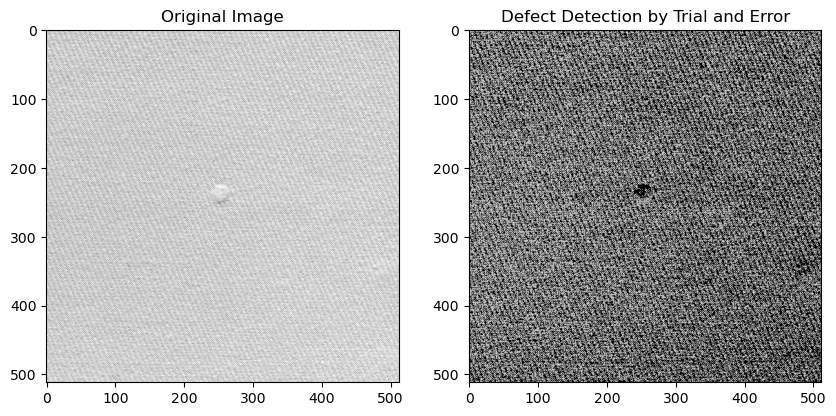

In [24]:

# Fit a normal distribution to the data
mu, sigma = norm.fit(pixel_values)

lower_bound = 130
upper_bound = 210

# Create a mask for pixels outside the bounds
outliers_mask = (pixel_matrix < lower_bound) | (pixel_matrix > upper_bound)

# Create a modified image with outliers set to black
modified_image = np.copy(pixel_matrix)
modified_image[outliers_mask] = 0  # Set outliers to black 
# Display the original and modified images
plt.figure(figsize=(10, 5))

# Original Image
plt.subplot(1, 2, 1)
plt.imshow(grayscale_image, cmap='gray', vmin=0, vmax=255)
plt.title('Original Image')

# Modified Image
plt.subplot(1, 2, 2)
plt.imshow(modified_image, cmap='gray', vmin=0, vmax=255)
plt.title('Defect Detection by Trial and Error')

plt.show()


Here one can see that defect can be shown in the middle of image by correctly choosing lower bound and upper bound. For now, we have found it by trial and error, however, we will propose an algorithm with autoregressive model in the end.

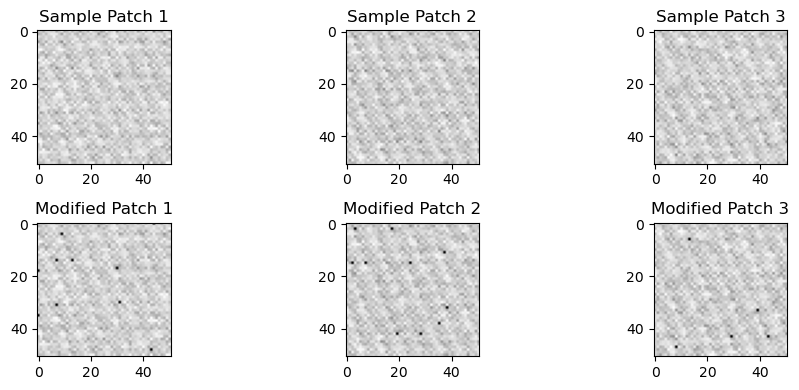

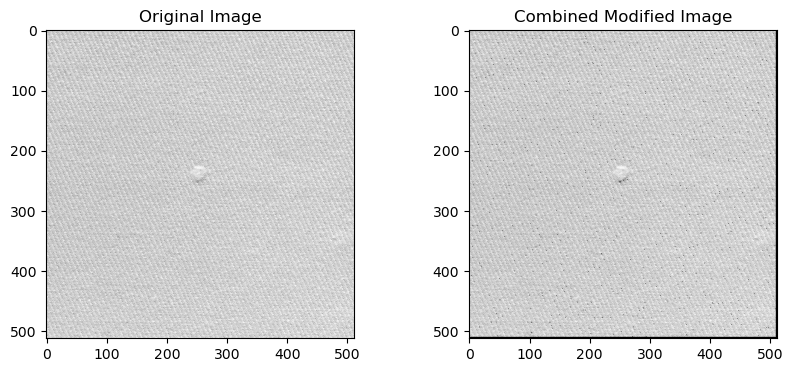

In [25]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm
from PIL import Image


# Parameters for patches
patch_size = 51
stride = 51  # Assuming non-overlapping patches

# Parameters for the normal distribution fitting
mean_threshold = 0.001
lower_bound = norm.ppf(mean_threshold)
upper_bound = norm.ppf(1 - mean_threshold)

# Function to identify outliers in a patch
def identify_outliers(patch):
    # Flatten the patch
    flat_patch = patch.flatten()

    # Fit a normal distribution to the data
    mu, sigma = norm.fit(flat_patch)

    # Identify outliers based on the probability limits
    outliers = (flat_patch < mu + lower_bound * sigma) | (flat_patch > mu + upper_bound * sigma)

    # Reshape outliers to the shape of the original patch
    outliers = outliers.reshape(patch.shape)
    # Set outliers to zero
    patch[outliers] = 0

    return patch


# Select three random patches to display
sample_patches = []
for _ in range(3):
    i, j = np.random.randint(0, pixel_matrix.shape[0] - patch_size + 1), np.random.randint(0, pixel_matrix.shape[1] - patch_size + 1)
    patch = pixel_matrix[i:i+patch_size, j:j+patch_size]
    sample_patches.append(patch)

# Process the sample patches
modified_sample_patches = [identify_outliers(patch.copy()) for patch in sample_patches]

# Display the sample patches
plt.figure(figsize=(10, 4))
for i in range(3):
    plt.subplot(2, 3, i + 1)
    plt.imshow(sample_patches[i], cmap='gray', vmin=0, vmax=255)
    plt.title(f'Sample Patch {i+1}')

    plt.subplot(2, 3, i + 4)
    plt.imshow(modified_sample_patches[i], cmap='gray', vmin=0, vmax=255)
    plt.title(f'Modified Patch {i+1}')

plt.tight_layout()
plt.show()

# Function to combine patches after setting outliers to zero
def combine_patches(image, patch_size, stride):
    combined_image = np.zeros_like(image)

    for i in range(0, image.shape[0] - patch_size + 1, stride):
        for j in range(0, image.shape[1] - patch_size + 1, stride):
            patch = image[i:i+patch_size, j:j+patch_size]
            modified_patch = identify_outliers(patch.copy())
            combined_image[i:i+patch_size, j:j+patch_size] += modified_patch

    return combined_image

# Display the full original and modified images
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.imshow(pixel_matrix, cmap='gray', vmin=0, vmax=255)
plt.title('Original Image')

plt.subplot(1, 2, 2)
combined_modified_image = combine_patches(pixel_matrix, patch_size, stride)
plt.imshow(combined_modified_image, cmap='gray', vmin=0, vmax=255)
plt.title('Combined Modified Image')

plt.show()


To display patch-work, 3 sample patch detection is chosen randomly and shown with their modified versions. Afterwards, patches are combined and modified version is displayed.

To comment on the detection performance of the patch-work, we have expected it to be true in the first place because it calculated the mean and sigma values of the distribution of each patch and calculated the lower bound and upper bound accordingly. However, it didn't give a better performance as one can observe from the comparison between images above. Because our image doesn't have many different patches, the mean and standard deviation of different patches didn't vary among each other. That's why, patch-work didn't perform well as expected.

The second reason for the bad performance is that our probability limits are really small. In the next cell, the probability limits will be updated and the performance is a little bit higher.


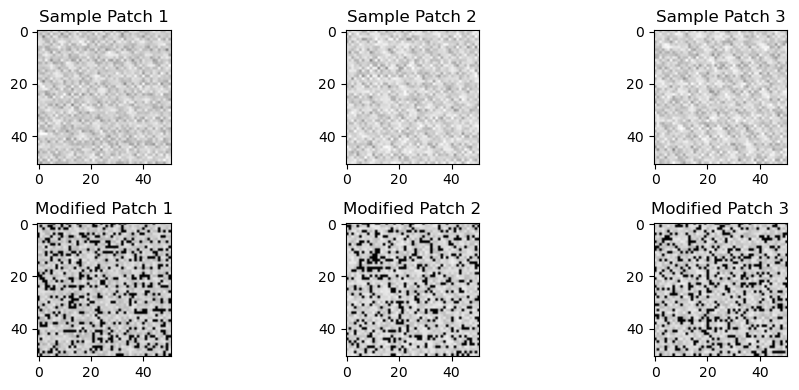

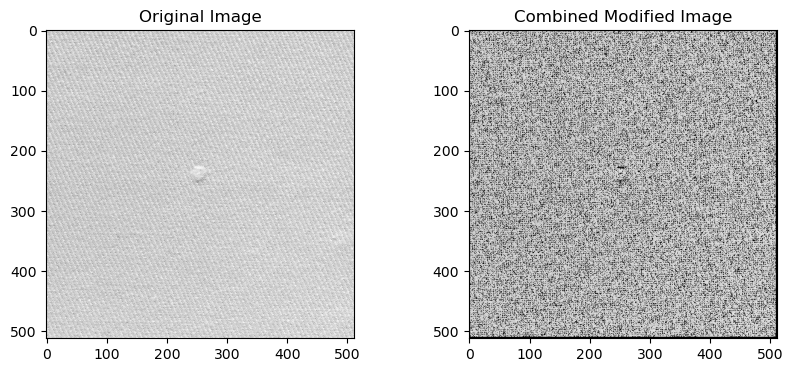

In [26]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm
from PIL import Image


# Parameters for patches
patch_size = 51
stride = 51  # Assuming non-overlapping patches

# Parameters for the normal distribution fitting
mean_threshold = 0.1
lower_bound = norm.ppf(mean_threshold)
upper_bound = norm.ppf(1 - mean_threshold)

# Function to identify outliers in a patch
def identify_outliers(patch):
    # Flatten the patch
    flat_patch = patch.flatten()

    # Fit a normal distribution to the data
    mu, sigma = norm.fit(flat_patch)

    # Identify outliers based on the probability limits
    outliers = (flat_patch < mu + lower_bound * sigma) | (flat_patch > mu + upper_bound * sigma)

    # Reshape outliers to the shape of the original patch
    outliers = outliers.reshape(patch.shape)
    # Set outliers to zero
    patch[outliers] = 0

    return patch


# Select three random patches to display
sample_patches = []
for _ in range(3):
    i, j = np.random.randint(0, pixel_matrix.shape[0] - patch_size + 1), np.random.randint(0, pixel_matrix.shape[1] - patch_size + 1)
    patch = pixel_matrix[i:i+patch_size, j:j+patch_size]
    sample_patches.append(patch)

# Process the sample patches
modified_sample_patches = [identify_outliers(patch.copy()) for patch in sample_patches]

# Display the sample patches
plt.figure(figsize=(10, 4))
for i in range(3):
    plt.subplot(2, 3, i + 1)
    plt.imshow(sample_patches[i], cmap='gray', vmin=0, vmax=255)
    plt.title(f'Sample Patch {i+1}')

    plt.subplot(2, 3, i + 4)
    plt.imshow(modified_sample_patches[i], cmap='gray', vmin=0, vmax=255)
    plt.title(f'Modified Patch {i+1}')

plt.tight_layout()
plt.show()

# Function to combine patches after setting outliers to zero
def combine_patches(image, patch_size, stride):
    combined_image = np.zeros_like(image)

    for i in range(0, image.shape[0] - patch_size + 1, stride):
        for j in range(0, image.shape[1] - patch_size + 1, stride):
            patch = image[i:i+patch_size, j:j+patch_size]
            modified_patch = identify_outliers(patch.copy())
            combined_image[i:i+patch_size, j:j+patch_size] += modified_patch

    return combined_image

# Display the full original and modified images
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.imshow(pixel_matrix, cmap='gray', vmin=0, vmax=255)
plt.title('Original Image')

plt.subplot(1, 2, 2)
combined_modified_image = combine_patches(pixel_matrix, patch_size, stride)
plt.imshow(combined_modified_image, cmap='gray', vmin=0, vmax=255)
plt.title('Combined Modified Image')

plt.show()


When we decrease the probability limits, again it didn't detect the defect in the middle with the performance on the general 130 and 210 limits as we have shown above because the defect in the middle is most probably contained in a patch and this patch has a mean and standard deviation accordingly. Therefore, the limits corresponding to the patch containing defect couldn't detect the defect.

Another approach in defect detection could be analyzing the rows and columns seperately. In this approach, each row has its own parameters and each column has its own parameters correspondingly. In detail, we have constructed control charts for each row with its own mean and variance. Then, out of control pixels are detected and their values are changed to zero. The new image and the original one is displayed. This process is repeated for the columns as well. After understanding the simple summary of the process; now, we can delve deep into the it and gain some useful insights. 

The mean is 204.330078125 and the variance is 511.4906578063965


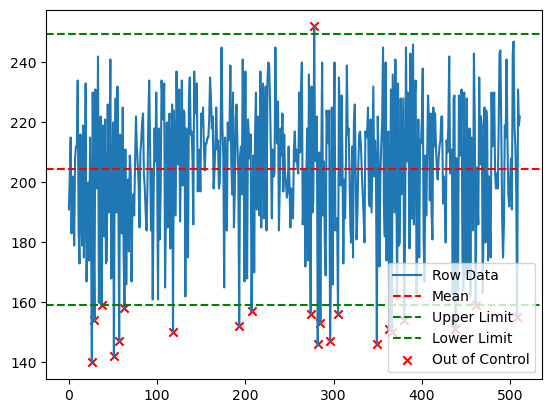

The mean is 203.9921875 and the variance is 447.87493896484375


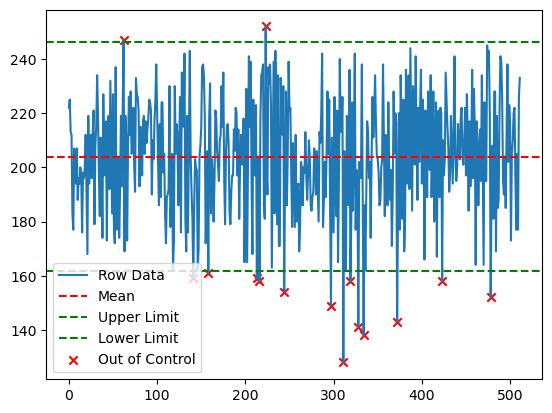

The mean is 206.95703125 and the variance is 473.65440368652344


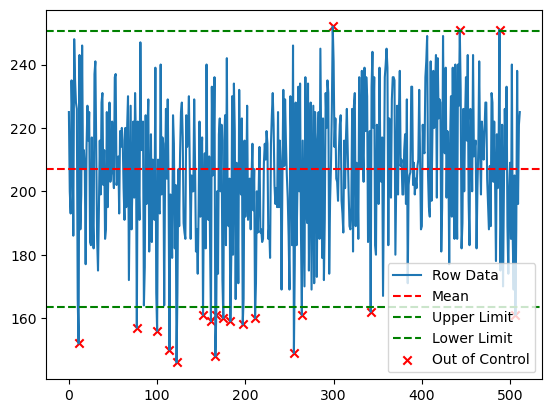

Coordinates of Out-of-Control Pixels:
[[  0  61]
 [  0  99]
 [  0 119]
 ...
 [511 460]
 [511 468]
 [511 482]]


In [27]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import zscore
import random

original_matrix = np.copy(pixel_matrix) # Original image copied to compare with the modified one
modified_matrix = np.copy(pixel_matrix) # Original image copied to utilize in the row-based approach
pixel_matrix2 = np.copy(pixel_matrix) # Original image copied to utilize in the column-based approach

# Function to create control chart for a given row or column
def control_chart(row_data):

    # Calculate mean and variance for the row
    row_mean = np.mean(row_data)
    row_var = np.var(row_data)

    # Calculate z-scores for each pixel in the row
    z_scores = zscore(row_data)

    # Set control limits
    upper_limit = 2  # Adjusted as needed (chosen by observation)
    lower_limit = -2  # Adjusted as needed (chosen by observation)

    # Identify out-of-control pixels
    out_of_control = np.where((z_scores > upper_limit) | (z_scores < lower_limit))[0]

    return out_of_control

# Choose 3 random rows/columns to observe the corresponding control charts
num_rows_to_display = 3
selected_rows = random.sample(range(pixel_matrix.shape[0]), num_rows_to_display)

# Function to plot control chart for a given row or column
def plotting(rows):
    row_mean = np.mean(rows)
    row_var = np.var(rows)
    print("The mean is", row_mean, "and the variance is", row_var)

    upper_limit = 2  # Adjusted as needed
    lower_limit = -2  # Adjusted as needed

    z_scores = zscore(rows)

    out_of_control = np.where((z_scores > upper_limit) | (z_scores < lower_limit))[0]

    plt.plot(rows, label='Row Data')
    plt.axhline(y=row_mean, color='r', linestyle='--', label='Mean')
    plt.axhline(y=row_mean + upper_limit * row_var**0.5, color='g', linestyle='--', label='Upper Limit')
    plt.axhline(y=row_mean + lower_limit * row_var**0.5, color='g', linestyle='--', label='Lower Limit')
    plt.scatter(out_of_control, rows[out_of_control], color='red', marker='x', label='Out of Control')
    plt.legend()
    plt.show()

# Iterate through each row/column
out_of_control_pixels = []
for i in range(modified_matrix.shape[0]):
    out_of_control_row = control_chart(modified_matrix[i, :])
    out_of_control_pixels.extend([(i, j) for j in out_of_control_row])
    if i == selected_rows[0] or i == selected_rows[1] or i == selected_rows[2]:
        plotting(modified_matrix[i, :])

# Convert the list of out-of-control pixels to NumPy array
out_of_control_pixels = np.array(out_of_control_pixels)

print("Coordinates of Out-of-Control Pixels:")
print(out_of_control_pixels)


Above, for the row-based approach, out-of-control pixels are detected. 3 random control charts and their parameters are displayed.

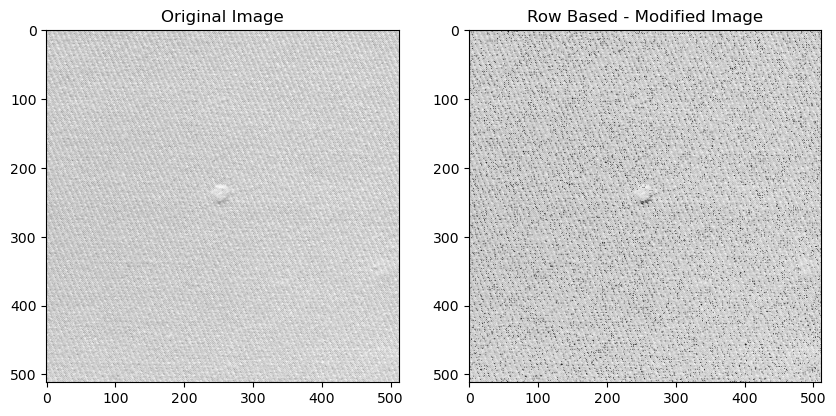

In [28]:
# Change the values of out-of-control pixels to zero
for pixel_coord in out_of_control_pixels:
    modified_matrix[pixel_coord[0], pixel_coord[1]] = 0

# Display the original and modified images
plt.figure(figsize=(10, 5))

# Original Image
plt.subplot(1, 2, 1)
plt.imshow(original_matrix, cmap='gray', vmin=0, vmax=255)
plt.title('Original Image')

# Modified Image
plt.subplot(1, 2, 2)
plt.imshow(modified_matrix, cmap='gray', vmin=0, vmax=255)
plt.title('Row Based - Modified Image') #Out-of-Control Pixels Set to Black

plt.show()

Pixels with out-of-control values are changed to zero, in other words, to the black color. The defect in the middle of the image becomes much more visible as we mark the out-of-control pixels with black.

Following that, for the column-based approach, the process is very much similar.

The mean is 203.970703125 and the variance is 493.77062606811523


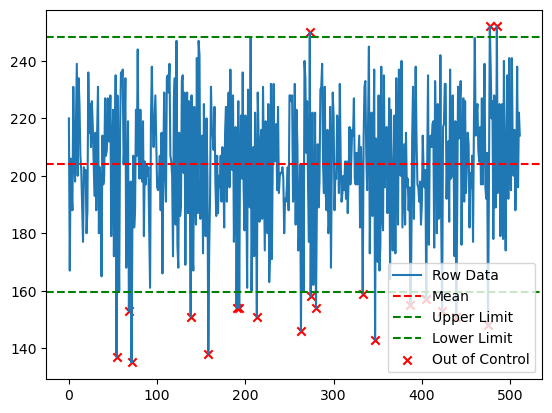

The mean is 204.09765625 and the variance is 453.39671325683594


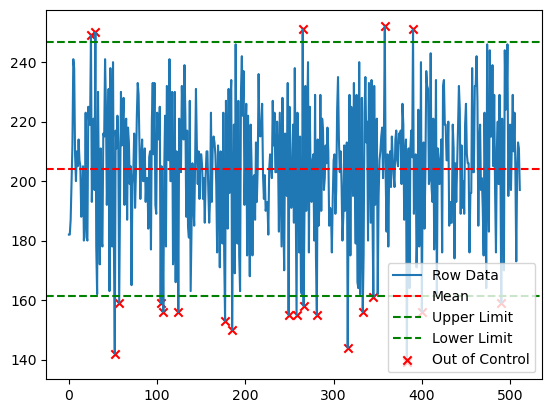

The mean is 205.3828125 and the variance is 467.18157958984375


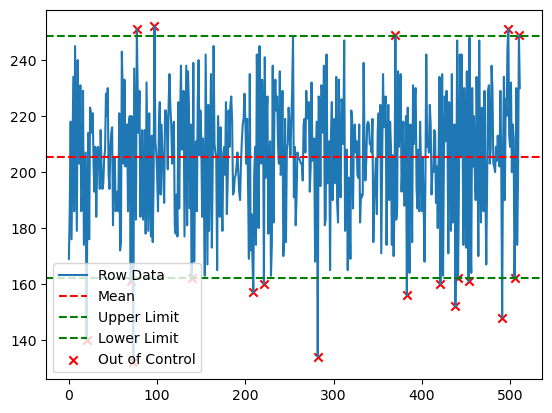

Coordinates of Out-of-Control Pixels:
[[  0  22]
 [  0  82]
 [  0  96]
 ...
 [511 352]
 [511 419]
 [511 489]]


In [29]:
transposed_matrix = np.transpose(pixel_matrix2) # Original image transposed to utilize in the column-based approach

# Following is the same with the above implementation
num_rows_to_display = 3
selected_rows = random.sample(range(pixel_matrix.shape[0]), num_rows_to_display)

# Iterate through each row
out_of_control_pixels_transposed = []
for i in range(transposed_matrix.shape[0]):
    out_of_control_row = control_chart(transposed_matrix[i, :])
    out_of_control_pixels_transposed.extend([(i, j) for j in out_of_control_row])
    if i == selected_rows[0] or i == selected_rows[1] or i == selected_rows[2]:
        plotting(transposed_matrix[i, :])

# Convert the list of out-of-control pixels to NumPy array
out_of_control_pixels_transposed = np.array(out_of_control_pixels_transposed)

print("Coordinates of Out-of-Control Pixels:")
print(out_of_control_pixels_transposed)

Above, for the column-based approach, out-of-control pixels are detected. 3 random control charts and their parameters are displayed.

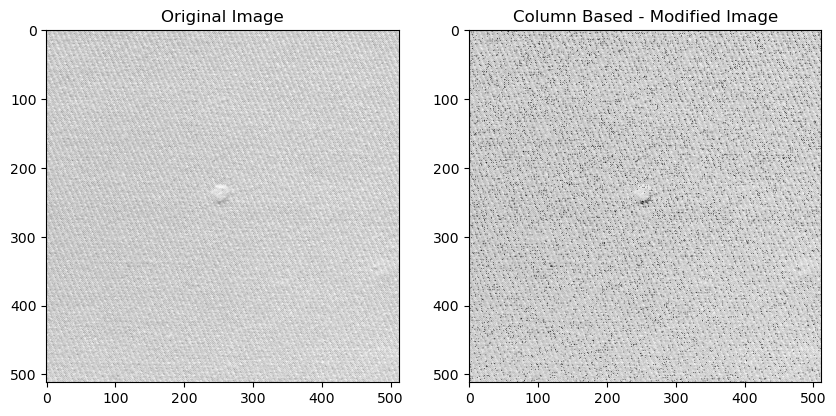

In [30]:
# Change the values of out-of-control pixels to zero
for pixel_coord in out_of_control_pixels_transposed:
    transposed_matrix[pixel_coord[0], pixel_coord[1]] = 0

modified_matrix2 = np.transpose(transposed_matrix)

# Display the original and modified images
plt.figure(figsize=(10, 5))

# Original Image
plt.subplot(1, 2, 1)
plt.imshow(original_matrix, cmap='gray', vmin=0, vmax=255)
plt.title('Original Image')

# Modified Image
plt.subplot(1, 2, 2)
plt.imshow(modified_matrix2, cmap='gray', vmin=0, vmax=255)
plt.title('Column Based - Modified Image') #Out-of-Control Pixels Set to Black

plt.show()

Pixels with out-of-control values are changed to zero, in other words, to the black color. The defect in the middle of the image becomes much more visible as we mark the out-of-control pixels with black.

Finally, we can focus on the similarity between the row-based and column-based approach. To do so, we utilized 2 different methods. The first one is the usual calculation of the correlation between the both image matrices. The second one utilizes the "Structural Similarity Index" which is particularly used for comparing images.

In [31]:
correlation_coefficient = np.corrcoef(modified_matrix.flatten(), modified_matrix2.flatten())[0, 1]
print(correlation_coefficient)

0.8277281361331115


In [32]:
from skimage.metrics import structural_similarity as ssim
similarity_index, _ = ssim(modified_matrix, modified_matrix2, full=True)
print(similarity_index)

0.8272114574699101


As one can see from the both methods, the 2 images acquired from the both approaches are very much similar to each other. Yet, there is a little difference that may have been arisen from various reasons. The row-based approach focuses on capturing horizontal defects across the fabric. So, it identifies flaws such as horizontal tears, thread breaks or weaving irregularities. However, the row-based approach may fail to detect flaws such as irregularities in the weave pattern, or vertical thread misalignments which are expected to be seen by a column-based approach. Since our linen fabric does not have such a specific defect (not specific to a row or a column), the created images do not differ in a significant manner. Yet, incase of an examination of another piece of fabric, utilizing both the row-based and column-based approaches might be very much helpful in detect defection.

In [33]:
import random
import os

# Generating 100 random integers between 2 and 196 
random.seed(42)
random_integers = [random.randint(2, 196) for _ in range(100)]

# Print the generated list
print(random_integers)



random_integers = [random.randint(2, 196) for _ in range(100)]



[165, 30, 8, 191, 72, 64, 59, 37, 190, 28, 175, 191, 141, 24, 153, 110, 10, 9, 25, 57, 61, 131, 156, 8, 145, 52, 185, 168, 181, 141, 109, 58, 116, 152, 73, 3, 196, 42, 180, 110, 89, 73, 41, 57, 88, 28, 25, 99, 26, 93, 90, 156, 69, 13, 188, 119, 139, 33, 98, 22, 143, 77, 162, 160, 94, 149, 51, 182, 19, 13, 171, 60, 76, 22, 61, 27, 99, 73, 118, 164, 95, 43, 96, 92, 55, 173, 70, 181, 176, 167, 20, 157, 164, 45, 138, 188, 64, 43, 120, 99]


165, 30, 8, 191, 72 are available

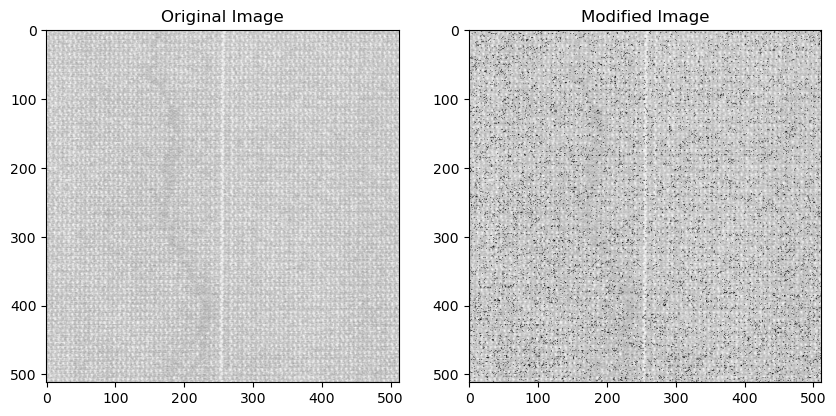

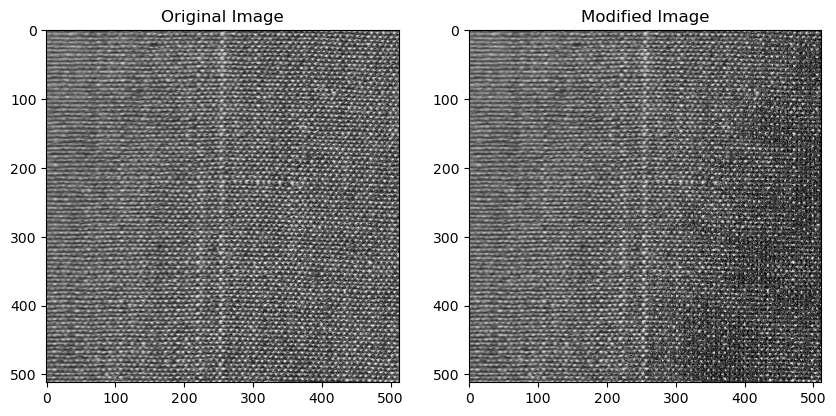

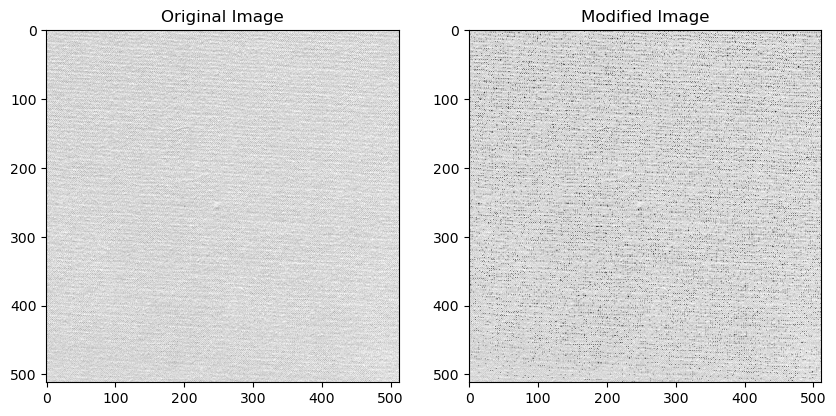

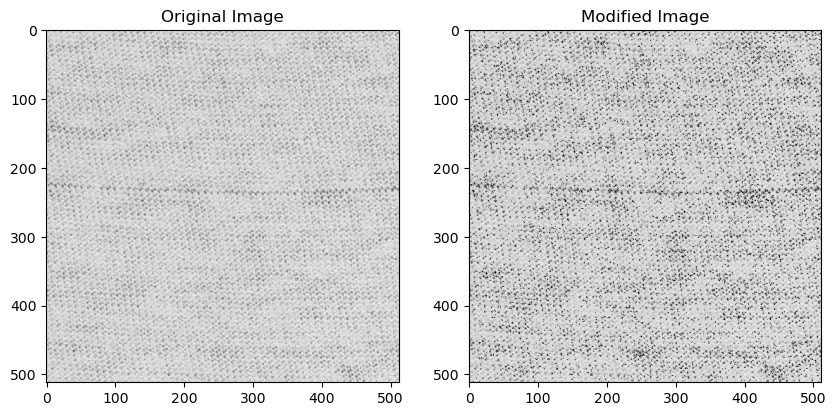

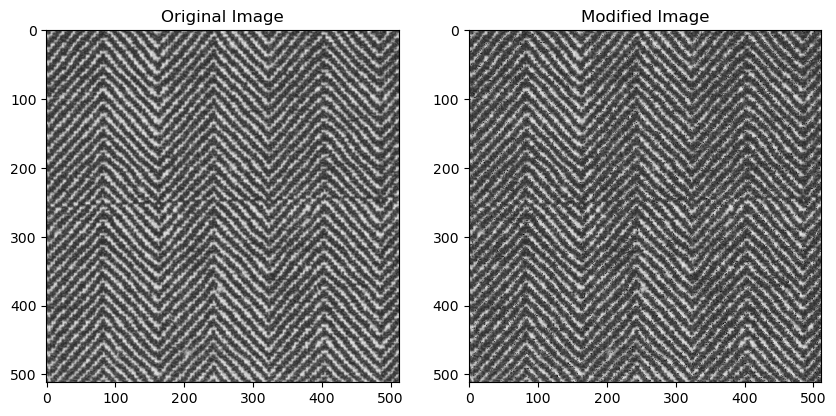

In [34]:
import numpy as np
from PIL import Image
from scipy.signal import convolve2d
import random

def identify_defects_with_ar_model(image_path):

    # Load the image and convert it to a numpy array
    original_image = Image.open(image_path)
    grayscale_image = original_image.convert("L")
    pixel_matrix = np.array(grayscale_image)

    # Define the neighborhood for the 2D autoregressive model
    
    
    kernel = np.array([[1, 1, 1],
                       [1, 0, 1],
                       [1, 1, 1]])
                     
    kernel = kernel / kernel.sum()


    # Apply the 2D convolution to get the predicted pixel values
    predicted = convolve2d(pixel_matrix, kernel, boundary='symm', mode='same')

    # Calculate the residuals
    residuals = pixel_matrix - predicted

    # Calculate the mean and standard deviation of the residuals
    residual_mean = np.mean(residuals)
    residual_std = np.std(residuals)

    # Set control limits as mean +/- 2*standard deviation 
    

    upper_control_limit = residual_mean + 2 * residual_std
    lower_control_limit = residual_mean -2 * residual_std

    # Identify potential defects based on the residuals exceeding control limits
    defects = (residuals > upper_control_limit) | (residuals < lower_control_limit)

    # Create an image to visualize the defects
    modified_image = np.copy(pixel_matrix)
    modified_image[defects] = 0 


    plt.figure(figsize=(10, 5))


    plt.subplot(1, 2, 1)
    plt.imshow(grayscale_image, cmap='gray', vmin=0, vmax=255)
    plt.title('Original Image')


    plt.subplot(1, 2, 2)
    plt.imshow(modified_image, cmap='gray', vmin=0, vmax=255)
    plt.title('Modified Image')

    plt.show()
    
    
    return residuals



image1 = identify_defects_with_ar_model(r"rawimage\0165.jpg")
image2 = identify_defects_with_ar_model(r"rawimage\0030.jpg")
image3 = identify_defects_with_ar_model(r"rawimage\0008.jpg")
image4 = identify_defects_with_ar_model(r"rawimage\0191.jpg")
image5 = identify_defects_with_ar_model(r"rawimage\0072.jpg")





In [35]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import zscore
import random

# control_chart() and plotting() functions are defined in the previous section

def control_chart_row(image_path, pixel_matrix, r):
    
    original_image = Image.open(image_path)
    grayscale_image = original_image.convert("L")
    original_matrix = np.array(grayscale_image)
    modified_matrix = np.copy(original_matrix)  
    
    if r == "Column":
        pixel_matrix = np.transpose(pixel_matrix) # Original image transposed to utilize in the column-based approach
        modified_matrix = np.transpose(modified_matrix)

    
    
    
    num_rows_to_display = 3
    selected_rows = random.sample(range(pixel_matrix.shape[0]), num_rows_to_display)

    
    out_of_control_pixels = []
    for i in range(pixel_matrix.shape[0]):
        out_of_control_row = control_chart(pixel_matrix[i, :])
        out_of_control_pixels.extend([(i, j) for j in out_of_control_row])
        if i in selected_rows:
            plotting(pixel_matrix[i, :])
    
    # Convert the list of out-of-control pixels to NumPy array
    out_of_control_pixels = np.array(out_of_control_pixels)
    

    print("Coordinates of Out-of-Control Pixels:")
    print(out_of_control_pixels)
    
    # Change the values of out-of-control pixels to zero
    for pixel_coord in out_of_control_pixels:
        modified_matrix[pixel_coord[0], pixel_coord[1]] = 0

    
    if r == "Column":
        out_of_control_pixels = np.transpose(out_of_control_pixels) 
        modified_matrix = np.transpose(modified_matrix)  
    
    # Display the original and modified images
    plt.figure(figsize=(10, 5))

    # Original Image
    plt.subplot(1, 2, 1)
    plt.imshow(original_matrix, cmap='gray', vmin=0, vmax=255)
    plt.title('Original Image')

    # Modified Image
    plt.subplot(1, 2, 2)
    plt.imshow(modified_matrix, cmap='gray', vmin=0, vmax=255)
    plt.title(f"{r} Based - Modified Image") 

    plt.show()




The mean is -0.012451171875 and the variance is 115.69659179449081


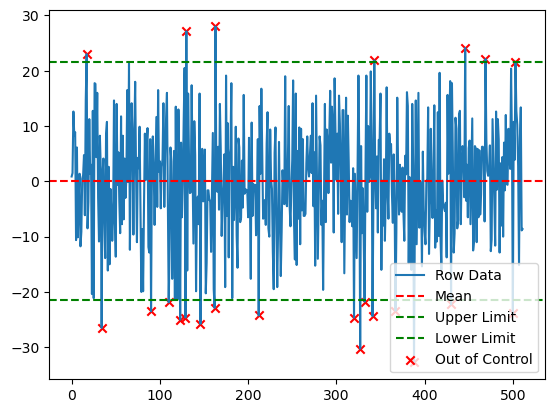

The mean is -0.14794921875 and the variance is 165.09163641929626


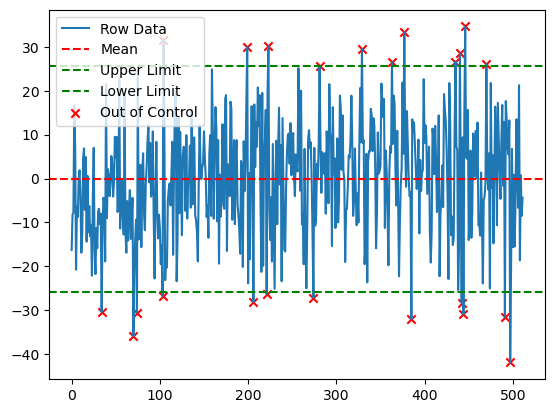

The mean is 0.07470703125 and the variance is 125.81479239463806


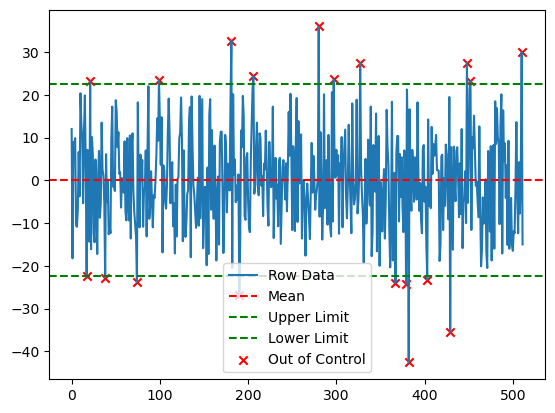

Coordinates of Out-of-Control Pixels:
[[  0  27]
 [  0  61]
 [  0  92]
 ...
 [511 473]
 [511 491]
 [511 493]]


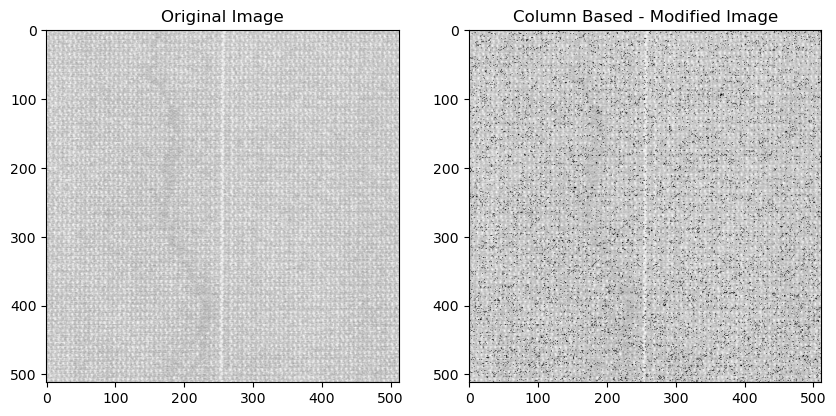

The mean is 0.1201171875 and the variance is 143.8287115097046


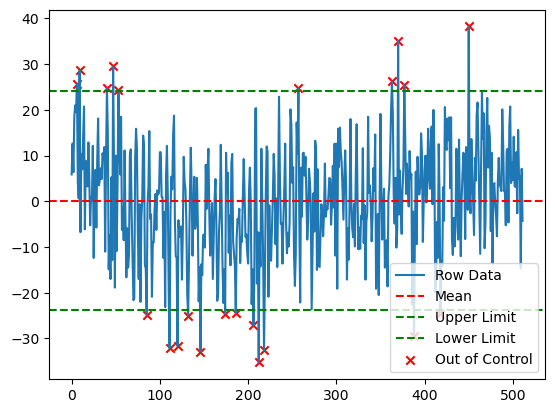

The mean is 1.423095703125 and the variance is 123.08963626623154


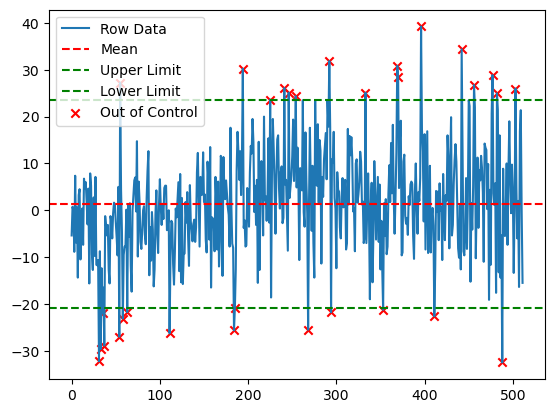

The mean is 1.32421875 and the variance is 139.4557342529297


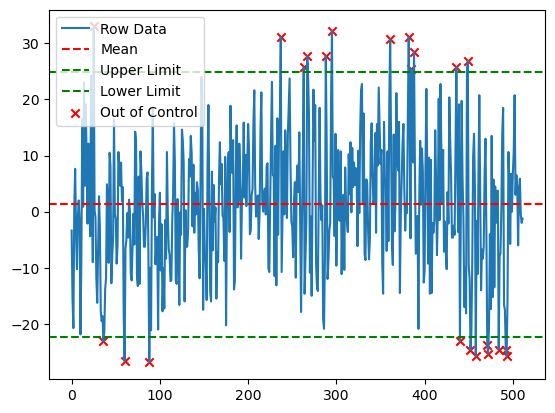

Coordinates of Out-of-Control Pixels:
[[  0  24]
 [  0  32]
 [  0  45]
 ...
 [511 421]
 [511 434]
 [511 476]]


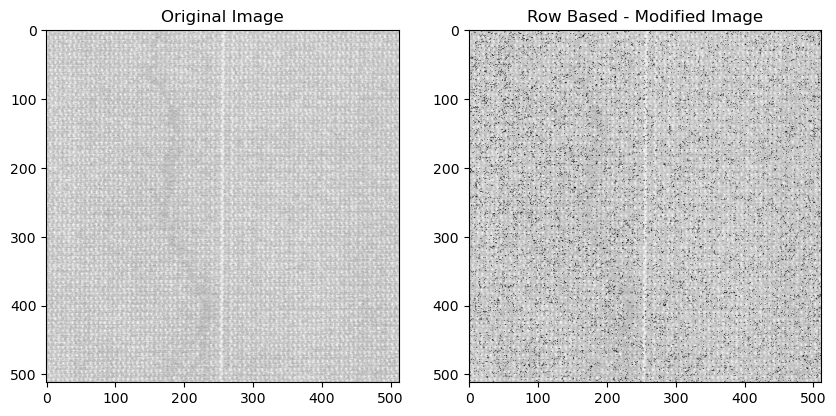

The mean is -2.949462890625 and the variance is 262.5660189986229


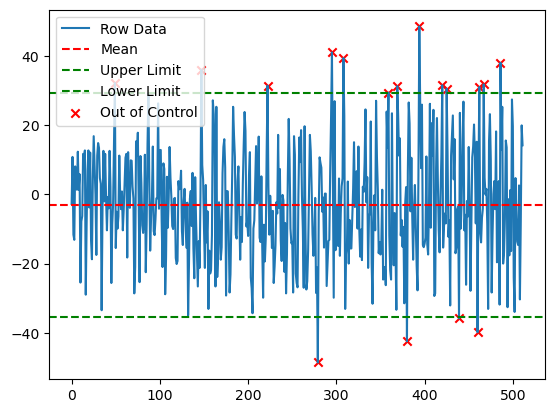

The mean is -0.025634765625 and the variance is 352.600325524807


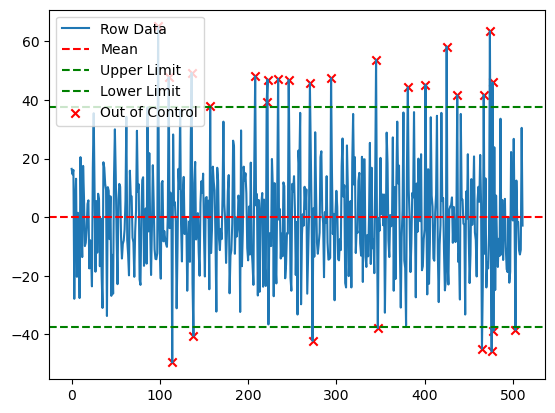

The mean is 3.555908203125 and the variance is 2848.407488286495


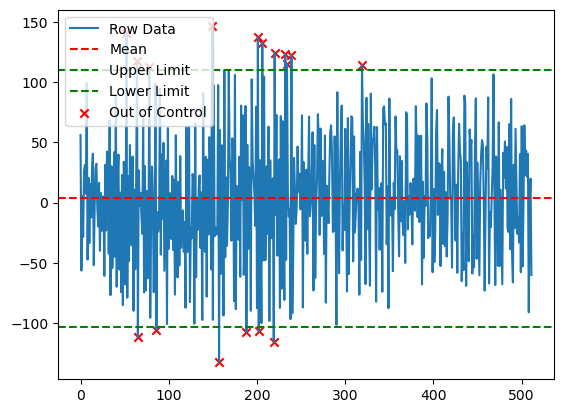

Coordinates of Out-of-Control Pixels:
[[  0  13]
 [  0  41]
 [  0  49]
 ...
 [511 407]
 [511 433]
 [511 467]]


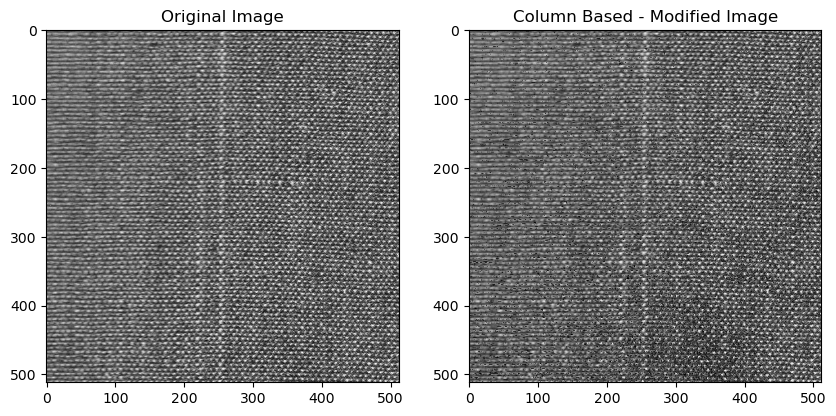

The mean is 1.450927734375 and the variance is 639.627383172512


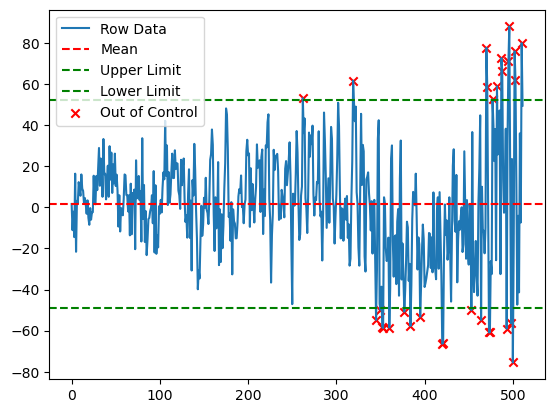

The mean is -2.445556640625 and the variance is 1379.7493247389793


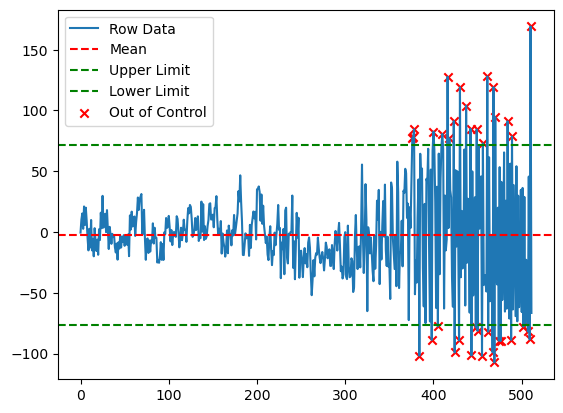

The mean is 8.996337890625 and the variance is 2595.0010547041893


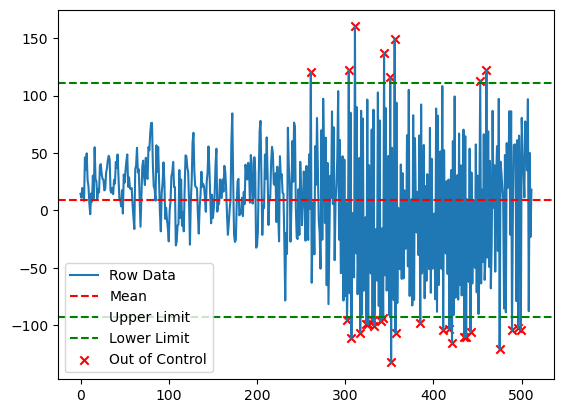

Coordinates of Out-of-Control Pixels:
[[  0 203]
 [  0 306]
 [  0 358]
 ...
 [511 490]
 [511 495]
 [511 511]]


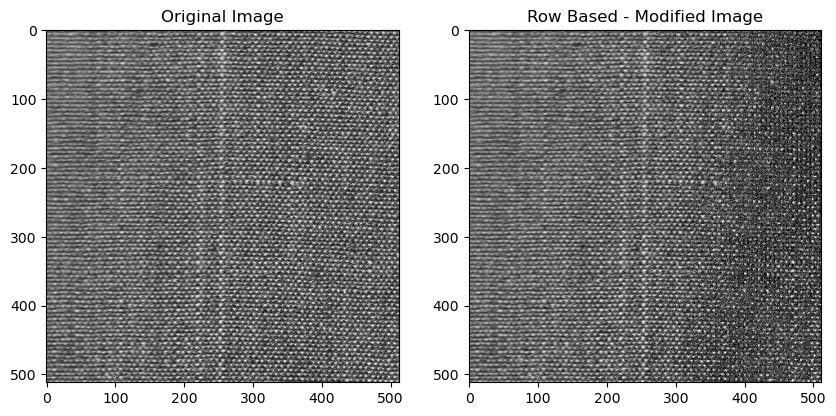

The mean is 0.98876953125 and the variance is 739.8648030757904


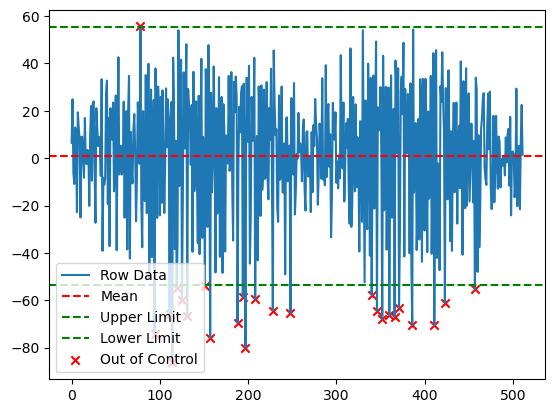

The mean is 0.960205078125 and the variance is 798.2472261786461


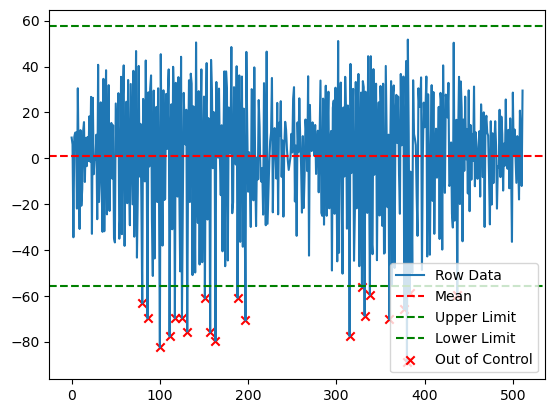

The mean is 0.979248046875 and the variance is 824.3953518271446


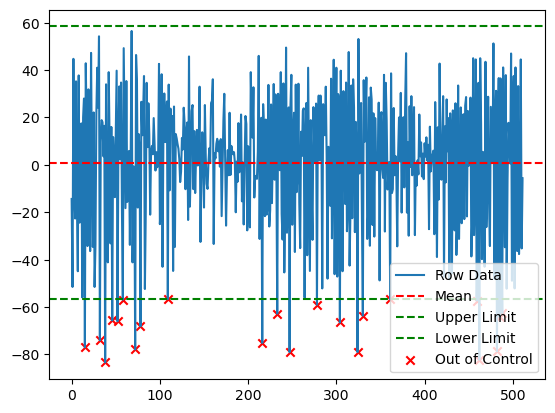

Coordinates of Out-of-Control Pixels:
[[  0   5]
 [  0  68]
 [  0 192]
 ...
 [511 348]
 [511 461]
 [511 481]]


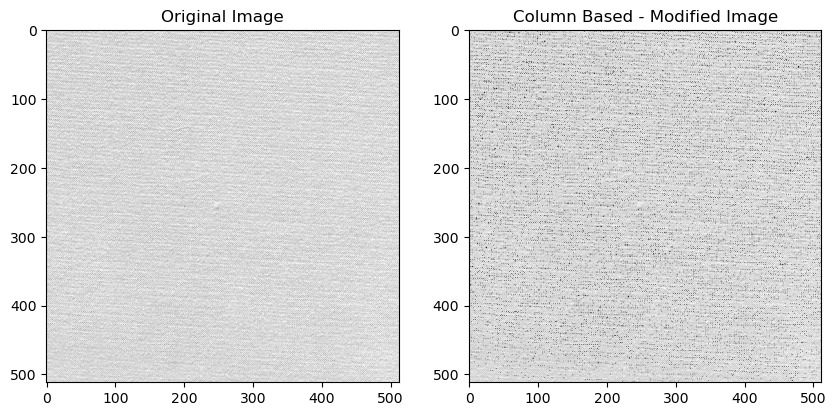

The mean is 0.418212890625 and the variance is 879.7124575972557


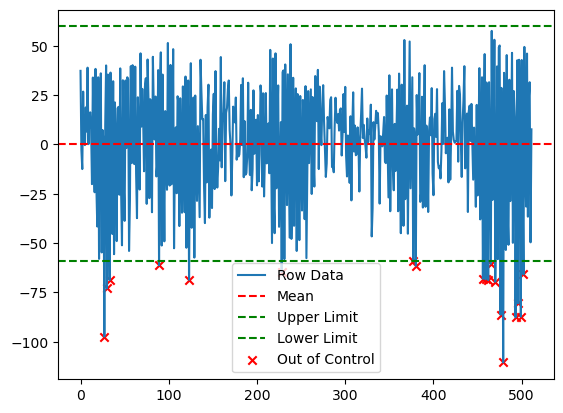

The mean is 0.257080078125 and the variance is 748.8328050971031


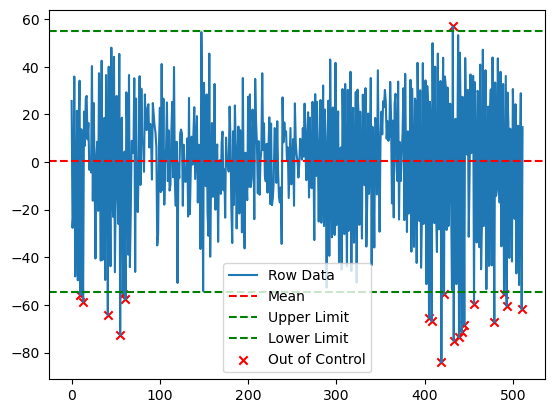

The mean is 1.0224609375 and the variance is 856.5448446273804


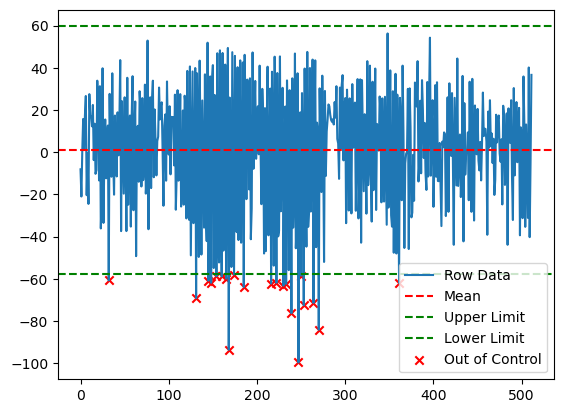

Coordinates of Out-of-Control Pixels:
[[  0 110]
 [  0 116]
 [  0 133]
 ...
 [511 297]
 [511 321]
 [511 400]]


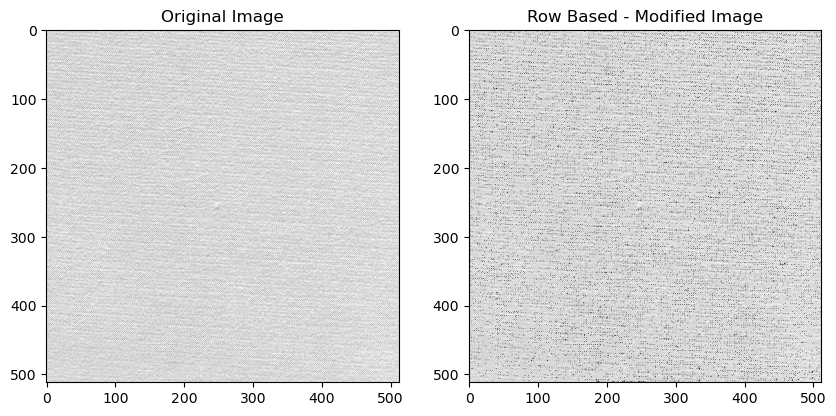

The mean is -0.6240234375 and the variance is 234.48162746429443


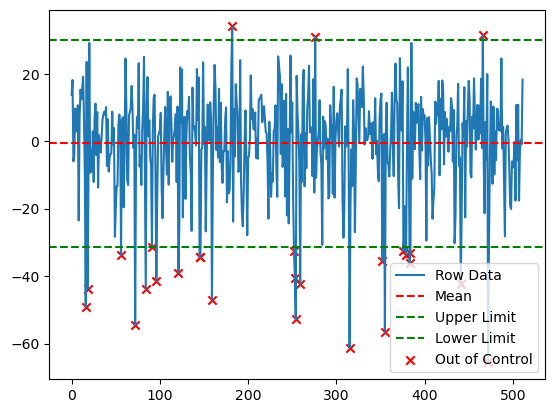

The mean is 0.22265625 and the variance is 212.41612243652344


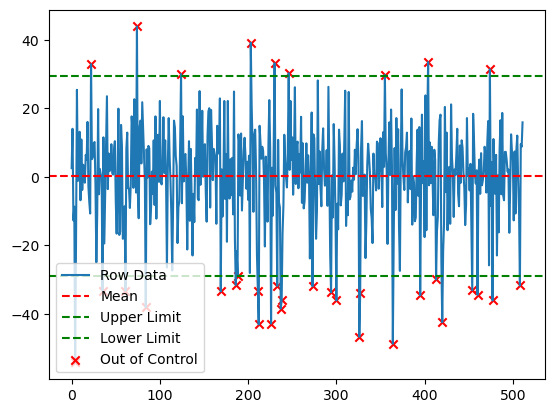

The mean is 0.18603515625 and the variance is 208.3155496120453


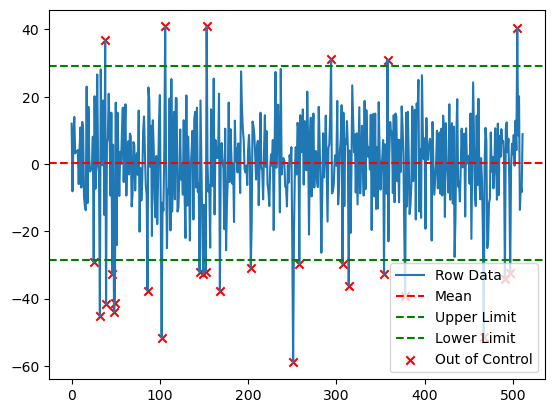

Coordinates of Out-of-Control Pixels:
[[  0  37]
 [  0  39]
 [  0  82]
 ...
 [511 459]
 [511 464]
 [511 481]]


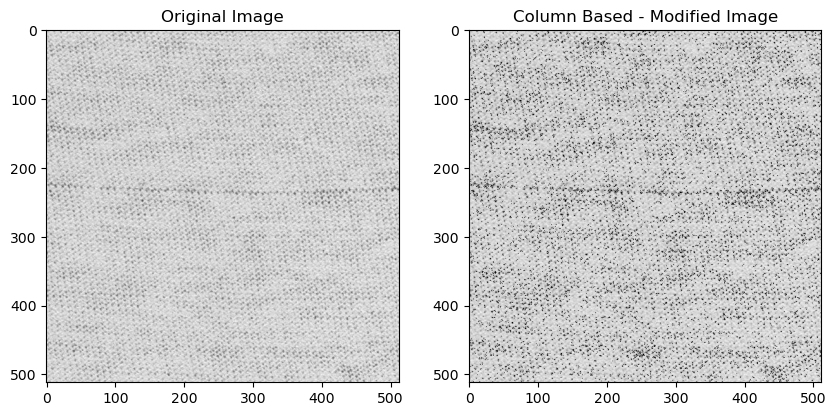

The mean is -0.383056640625 and the variance is 258.0863303542137


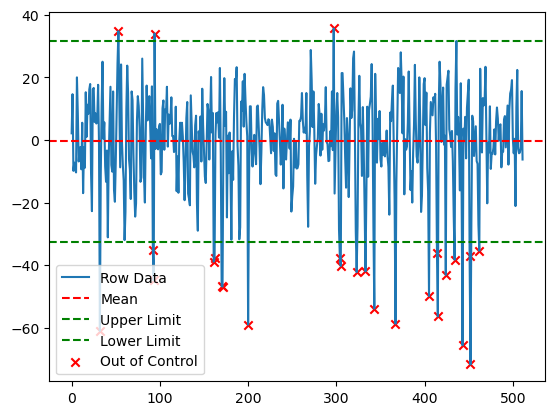

The mean is 0.7646484375 and the variance is 234.47616481781006


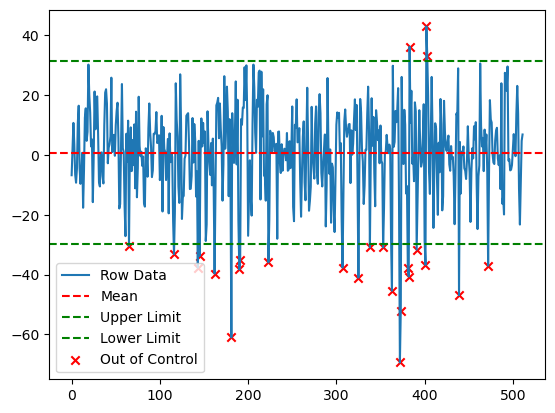

The mean is -0.531005859375 and the variance is 209.14128106832504


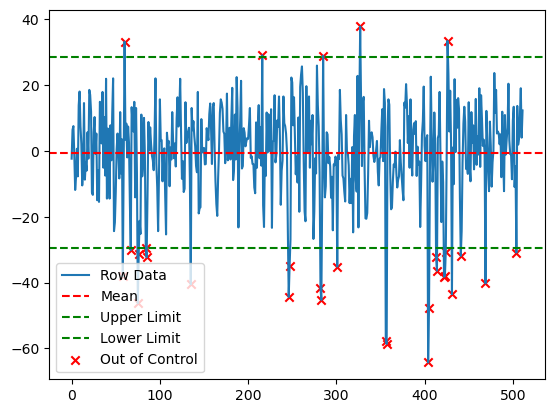

Coordinates of Out-of-Control Pixels:
[[  0  65]
 [  0  67]
 [  0  79]
 ...
 [511 450]
 [511 452]
 [511 507]]


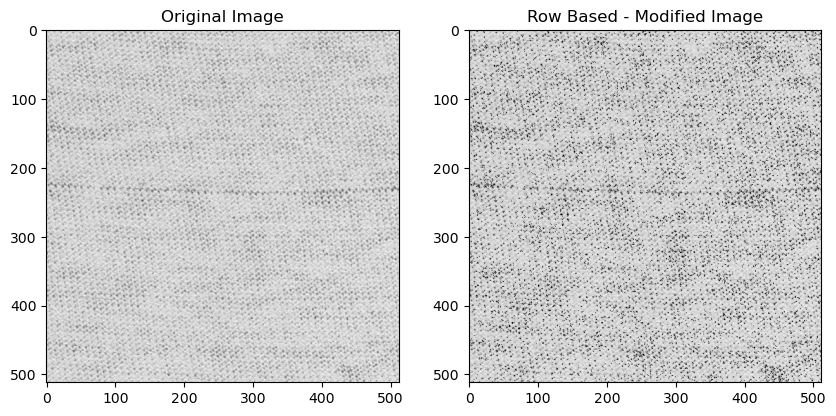

The mean is -3.70166015625 and the variance is 274.7347238063812


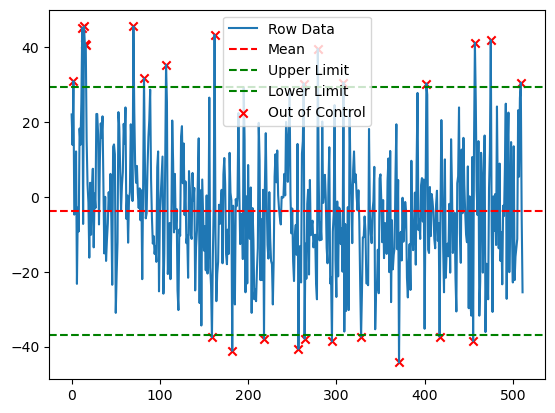

The mean is -1.728515625 and the variance is 280.8537254333496


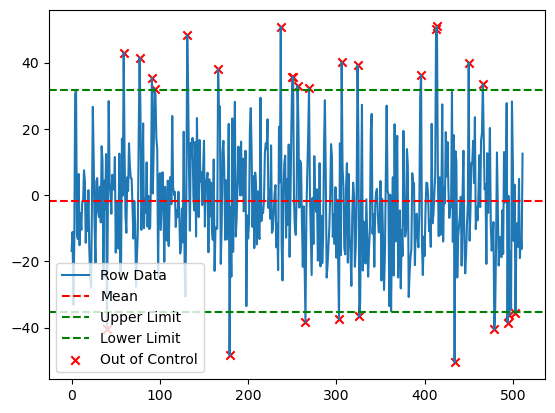

The mean is -5.25 and the variance is 322.66864013671875


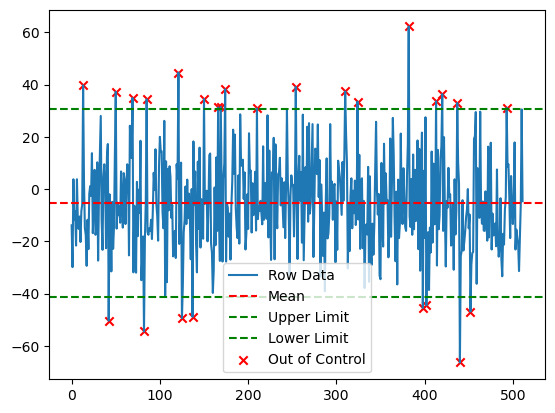

Coordinates of Out-of-Control Pixels:
[[  0  50]
 [  0  96]
 [  0 132]
 ...
 [511 480]
 [511 485]
 [511 486]]


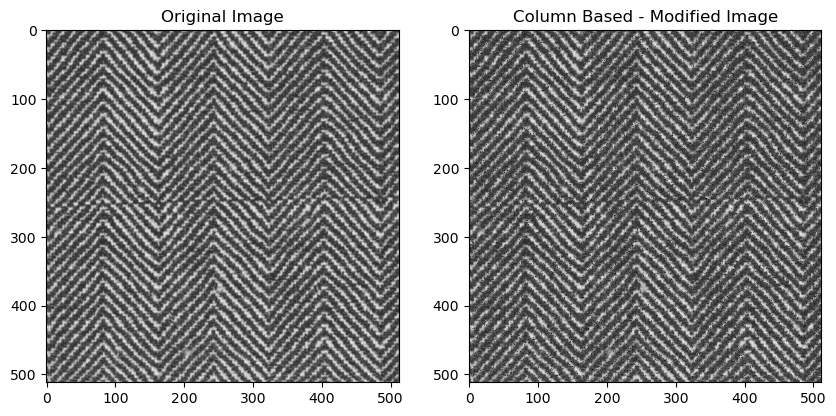

The mean is -1.19384765625 and the variance is 255.89815306663513


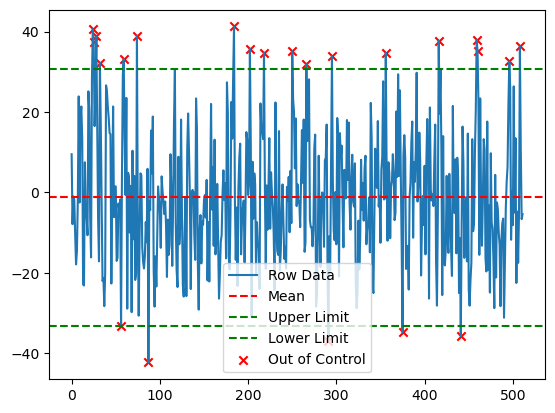

The mean is -0.10693359375 and the variance is 313.37278151512146


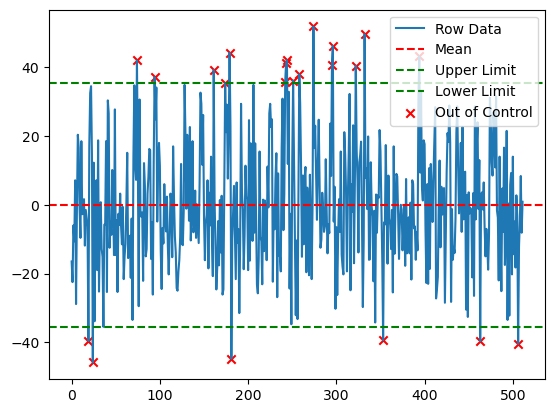

The mean is -1.330810546875 and the variance is 300.6875919699669


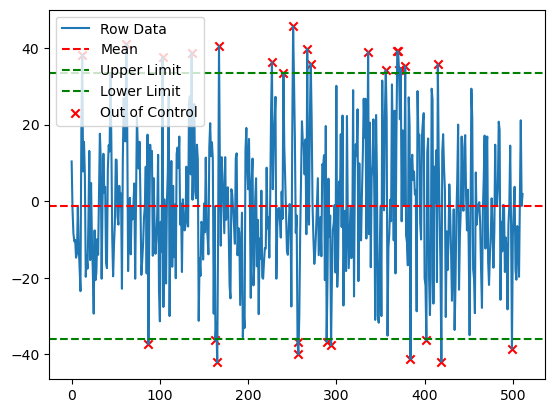

Coordinates of Out-of-Control Pixels:
[[  0  59]
 [  0  92]
 [  0 105]
 ...
 [511 467]
 [511 498]
 [511 502]]


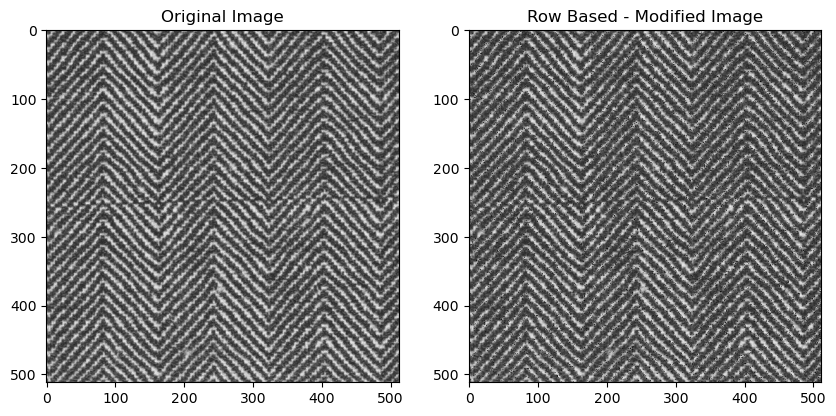

In [36]:
control_chart_row(r"rawimage\0165.jpg", image1, "Column")
control_chart_row(r"rawimage\0165.jpg", image1, "Row")

control_chart_row(r"rawimage\0030.jpg", image2, "Column")
control_chart_row(r"rawimage\0030.jpg", image2, "Row")

control_chart_row(r"rawimage\0008.jpg", image3, "Column")
control_chart_row(r"rawimage\0008.jpg", image3, "Row")

control_chart_row(r"rawimage\0191.jpg", image4, "Column")
control_chart_row(r"rawimage\0191.jpg", image4, "Row")

control_chart_row(r"rawimage\0072.jpg", image5, "Column")
control_chart_row(r"rawimage\0072.jpg", image5, "Row")
